In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pd.set_option("display.max_rows", 1000, "display.max_columns", None)
from matplotlib.pyplot import figure

# Helper function given by Professor

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.signal import find_peaks
import warnings

warnings.filterwarnings('ignore')


def get_time_series_features(signal):
    window_size = len(signal)
    # mean
    sig_mean = np.mean(signal)
    # standard deviation
    sig_std = np.std(signal)
    # avg absolute difference
    sig_aad = np.mean(np.absolute(signal - np.mean(signal)))
    # min
    sig_min = np.min(signal)
    # max
    sig_max = np.max(signal)
    # max-min difference
    sig_maxmin_diff = sig_max - sig_min
    # median
    sig_median = np.median(signal)
    # median absolute deviation
    sig_mad = np.median(np.absolute(signal - np.median(signal)))
    # Inter-quartile range
    sig_IQR = np.percentile(signal, 75) - np.percentile(signal, 25)
    # negative count
    sig_neg_count = np.sum(s < 0 for s in signal)
    # positive count
    sig_pos_count = np.sum(s > 0 for s in signal)
    # values above mean
    sig_above_mean = np.sum(s > sig_mean for s in signal)
    # number of peaks
    sig_num_peaks = len(find_peaks(signal)[0])
    # skewness
    sig_skew = stats.skew(signal)
    # kurtosis
    sig_kurtosis = stats.kurtosis(signal)
    # energy
    sig_energy = np.sum(s ** 2 for s in signal) / window_size
    # signal area
    sig_sma = np.sum(signal) / window_size

    return [sig_mean, sig_std, sig_aad, sig_min, sig_max, sig_maxmin_diff, sig_median, sig_mad, sig_IQR, sig_neg_count, sig_pos_count, sig_above_mean, sig_num_peaks, sig_skew, sig_kurtosis, sig_energy, sig_sma]


def get_freq_domain_features(signal):
    all_fft_features = []
    window_size = len(signal)
    signal_fft = np.abs(np.fft.fft(signal))
    # Signal DC component
    sig_fft_dc = signal_fft[0]
    # aggregations over the fft signal
    fft_feats = get_time_series_features(signal_fft[1:int(window_size / 2) + 1])

    all_fft_features.append(sig_fft_dc)
    all_fft_features.extend(fft_feats)
    return all_fft_features

## Loading the dataset

In [6]:
columns = ['user','activity','timestamp', 'x-axis', 'y-axis', 'z-axis']
df = pd.read_csv('WISDM_ar_v1.1/WISDM_ar_v1.1_raw.txt', header = None, names = columns, on_bad_lines='skip')

In [7]:
df

,user,activity,timestamp,x-axis,y-axis,z-axis
0,33,Jogging,49105962326000,-0.694638,12.680544,0.50395286;
1,33,Jogging,49106062271000,5.012288,11.264028,0.95342433;
2,33,Jogging,49106112167000,4.903325,10.882658,-0.08172209;
3,33,Jogging,49106222305000,-0.612916,18.496431,3.0237172;
4,33,Jogging,49106332290000,-1.184970,12.108489,7.205164;
...,...,...,...,...,...,...
1086461,19,Sitting,131623331483000,9.000000,-1.570000,1.69;
1086462,19,Sitting,131623371431000,9.040000,-1.460000,1.73;
1086463,19,Sitting,131623411592000,9.080000,-1.380000,1.69;
1086464,19,Sitting,131623491487000,9.000000,-1.460000,1.73;


In [8]:
df.describe()

,user,timestamp,x-axis,y-axis
count,1.086466e+06,1.086466e+06,1.086466e+06,1.086466e+06
mean,1.883755e+01,3.250277e+13,6.641165e-01,7.246042e+00
std,1.026681e+01,4.893649e+13,6.876275e+00,6.739787e+00
min,1.000000e+00,0.000000e+00,-1.961000e+01,-1.961000e+01
25%,1.000000e+01,1.999712e+12,-2.910000e+00,3.170000e+00
50%,1.900000e+01,9.396193e+12,2.700000e-01,7.930000e+00
75%,2.800000e+01,3.509472e+13,4.440000e+00,1.156000e+01
max,3.600000e+01,2.093974e+14,1.995000e+01,2.004000e+01


## Data Cleaning and Preprocessing

In this section, we will deal with data cleaning and preprocessing it using various methods.


### Finding missing values and values with timestamp as 0 or with x-y-z axis both as zero

In [9]:
df[df['timestamp']==0]

,user,activity,timestamp,x-axis,y-axis,z-axis
14398,20,Walking,0,0.0,0.0,0.0;
14399,20,Walking,0,0.0,0.0,0.0;
14643,20,Walking,0,0.0,0.0,0.0;
14644,20,Walking,0,0.0,0.0,0.0;
14645,20,Walking,0,0.0,0.0,0.0;
...,...,...,...,...,...,...
870639,3,Walking,0,0.0,0.0,0;
870640,3,Walking,0,0.0,0.0,0;
926475,22,Downstairs,0,0.0,0.0,0;
926476,22,Downstairs,0,0.0,0.0,0;


It appears that out of 1086466 entries, 12842 contain values which are trash and do not make sense, so we will drop those and update our df.

In [10]:
df = df[df['timestamp']!=0] #dropping rows with values which do not make sense, eg, timestamp = 0, x=y=z=0
df

,user,activity,timestamp,x-axis,y-axis,z-axis
0,33,Jogging,49105962326000,-0.694638,12.680544,0.50395286;
1,33,Jogging,49106062271000,5.012288,11.264028,0.95342433;
2,33,Jogging,49106112167000,4.903325,10.882658,-0.08172209;
3,33,Jogging,49106222305000,-0.612916,18.496431,3.0237172;
4,33,Jogging,49106332290000,-1.184970,12.108489,7.205164;
...,...,...,...,...,...,...
1086461,19,Sitting,131623331483000,9.000000,-1.570000,1.69;
1086462,19,Sitting,131623371431000,9.040000,-1.460000,1.73;
1086463,19,Sitting,131623411592000,9.080000,-1.380000,1.69;
1086464,19,Sitting,131623491487000,9.000000,-1.460000,1.73;


In [282]:
#Dropping NA values
df.dropna(inplace=True)
df

,user,activity,timestamp,x-axis,y-axis,z-axis
0,33,Jogging,49105962326000,-0.694638,12.680544,0.503953
1,33,Jogging,49106062271000,5.012288,11.264028,0.953424
2,33,Jogging,49106112167000,4.903325,10.882658,-0.081722
3,33,Jogging,49106222305000,-0.612916,18.496431,3.023717
4,33,Jogging,49106332290000,-1.184970,12.108489,7.205164
...,...,...,...,...,...,...
1086461,19,Sitting,131623331483000,9.000000,-1.570000,1.690000
1086462,19,Sitting,131623371431000,9.040000,-1.460000,1.730000
1086463,19,Sitting,131623411592000,9.080000,-1.380000,1.690000
1086464,19,Sitting,131623491487000,9.000000,-1.460000,1.730000


In [11]:
df.dtypes

user           int64
activity      object
timestamp      int64
x-axis       float64
y-axis       float64
z-axis        object
dtype: object

We also see that z-has is suffixed with a semicolon, we need to remove that too and convert the column to float from string

In [12]:
df['z-axis']=df['z-axis'].str.replace(";","");
df['z-axis']=df['z-axis'].astype('float')
df

/var/folders/v7/x0q1prcs3rg8mj2_1qh8dq6m0000gn/T/ipykernel_15609/1638964320.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['z-axis']=df['z-axis'].str.replace(";","");
/var/folders/v7/x0q1prcs3rg8mj2_1qh8dq6m0000gn/T/ipykernel_15609/1638964320.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['z-axis']=df['z-axis'].astype('float')


,user,activity,timestamp,x-axis,y-axis,z-axis
0,33,Jogging,49105962326000,-0.694638,12.680544,0.503953
1,33,Jogging,49106062271000,5.012288,11.264028,0.953424
2,33,Jogging,49106112167000,4.903325,10.882658,-0.081722
3,33,Jogging,49106222305000,-0.612916,18.496431,3.023717
4,33,Jogging,49106332290000,-1.184970,12.108489,7.205164
...,...,...,...,...,...,...
1086461,19,Sitting,131623331483000,9.000000,-1.570000,1.690000
1086462,19,Sitting,131623371431000,9.040000,-1.460000,1.730000
1086463,19,Sitting,131623411592000,9.080000,-1.380000,1.690000
1086464,19,Sitting,131623491487000,9.000000,-1.460000,1.730000


In [13]:
df.dtypes

user           int64
activity      object
timestamp      int64
x-axis       float64
y-axis       float64
z-axis       float64
dtype: object

So essentially, data is cleaned now. Our next step would be do some Exploratory Data Analyses[EDA]

### Exploratory Data Analysis

In this section, we would plot various graphs to see user-based patters, activity based patters, etc

#### Plotting data of some users using the magnitude of x, y and z

In [101]:

def plot_user_activity(userId, activity, spec_range_start=0, spec_range_end=len(df)):
    data_to_plot = df[(df['user']==userId) & (df['activity']==activity)]
    #print(data_to_plot)
    #print(df)
    magnitudes = np.sqrt(data_to_plot['x-axis']**2+data_to_plot['y-axis']**2+data_to_plot['z-axis']**2)
    title_for_graph = f"Activity={activity} for user Id = {userId}"
    #print(magnitudes)
    figure(figsize=(40, 20), dpi=80)

    plt.title(title_for_graph)
    plt.plot(magnitudes[spec_range_start:spec_range_end])
    

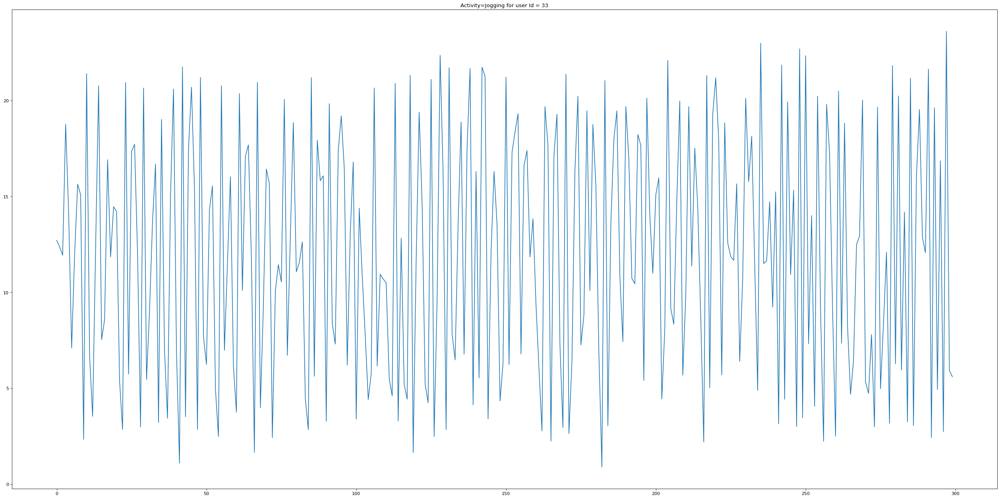

In [106]:
plot_user_activity(33,'Jogging', 0, 300)

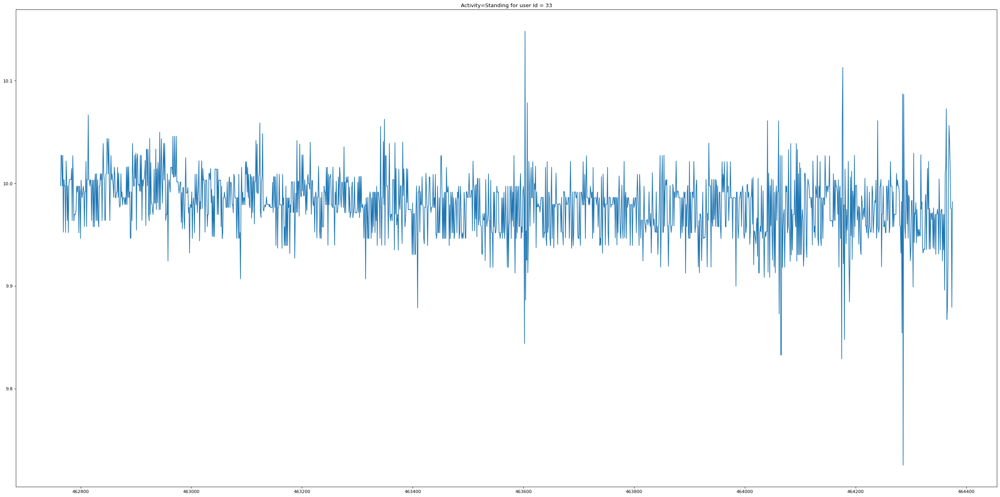

In [98]:
plot_user_activity(33,'Standing')

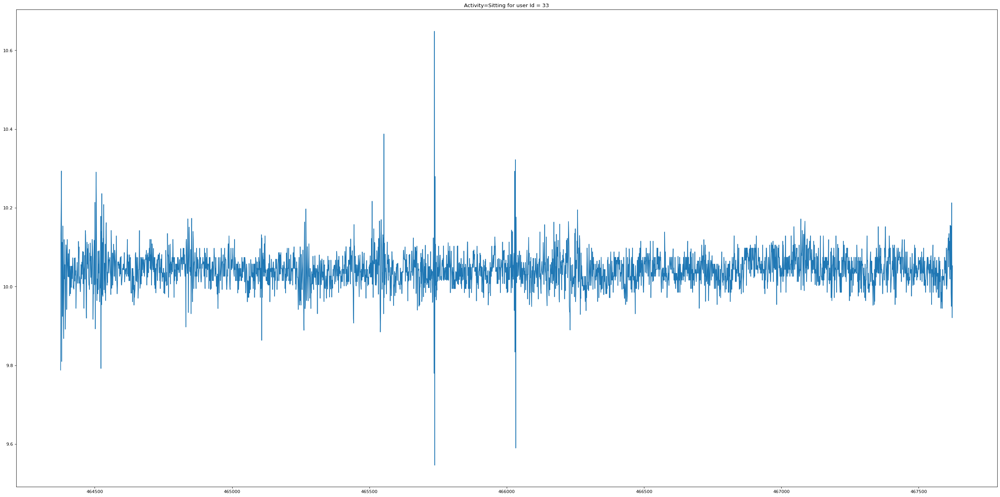

In [99]:
plot_user_activity(33,'Sitting')

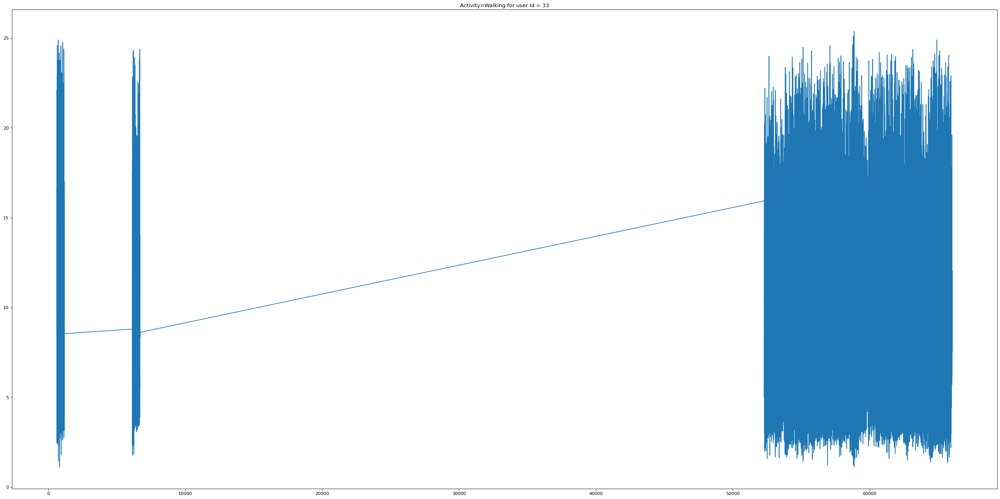

In [100]:
plot_user_activity(33,'Walking')

# Segmenting the data and feature generation

1. Splitting the dataset to create small segments 
2. Using each segment to generate 35 time and frequency domain features per axis of accelerometer reading
3. This gives us a total of 105 features(x,y and z)

N.B. I have appended userId and activity type in the dataframe as it may act like a metadata later for splitting the data.

In [183]:
def feature_extract_segment_data(df, window_duration, step_duration):
    dataset = []
    window_size = int(window_duration * 20)#Hz
    step_size = int(step_duration * 20)#Hz
    
    print(window_size, step_size)
    for user in df['user'].unique():
        for activity in df['activity'].unique():
            print(f"Extracting data from user {user} for activity {activity}")
            new_df = df[(df['user']==user) & (df['activity']==activity)]
            start=0
            end = window_size;
            while end<=len(new_df): #end!=len(new_df):
                features_per_window = []
                print(f'Extracting from {start} to {end}');
                window = new_df.iloc[start:end,:];
                features_per_window.extend(get_time_series_features(window['x-axis']))                           
                features_per_window.extend(get_freq_domain_features(window['x-axis']))
               
                features_per_window.extend(get_time_series_features(window['y-axis']))                          
                features_per_window.extend(get_freq_domain_features(window['y-axis']))
                                           
                                           
                features_per_window.extend(get_time_series_features(window['z-axis']))                          
                features_per_window.extend(get_freq_domain_features(window['z-axis']))
                                           
                features_per_window.extend([user, activity]);
                                           
                start+=step_size;
                end+=step_size;
               
                    
                dataset.append(features_per_window);
    return pd.DataFrame(dataset);

Generating windows of 30 second each, with overlap of 50% which is 15 seconds. You can see the output which verifies the same. It leaves us with a dataset of 3309 entries. This will later be split into test and training set

In [184]:
final_dataset = feature_extract_segment_data(df, 30, 15)

600 300
Extracting data from user 33 for activity Jogging
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting data from user 33 for activity Walking
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting from 3900 to 4500
Extracting from 4200 to 4800
Extracting from 4500 to 5100
Extracting from 4800 to 5400
Extracting from 5100 to 5700
Extracting from 5400 to 6000
Extracting from 5700 to 6300
Extracting from 6000 to 6600
Extracting from 6300 to 6900
Extracting from 6600 to 7200
Extractin

Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting from 3900 to 4500
Extracting from 4200 to 4800
Extracting from 4500 to 5100
Extracting from 4800 to 5400
Extracting from 5100 to 5700
Extracting from 5400 to 6000
Extracting from 5700 to 6300
Extracting from 6000 to 6600
Extracting from 6300 to 6900
Extracting from 6600 to 7200
Extracting from 6900 to 7500
Extracting from 7200 to 7800
Extracting from 7500 to 8100
Extracting from 7800 to 8400
Extracting from 8100 to 8700
Extracting from 8400 to 9000
Extracting from 8700 to 9300
Extracting from 9000 to 9600
Extracting from 9300 to 9900
Extracting from 9600 to 10200
Extracting from 9900 to 10500
Extracting from 1020

Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting data from user 13 for activity Sitting
Extracting from 0 to 600
Extracting from 300 to 900
Extracting data from user 13 for activity Standing
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting data from user 15 for activity Jogging
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting from 3900 to 4500
Extracting from 4200 to 4800
E

Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting data from user 27 for activity Sitting
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting data from user 27 for activity Standing
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting data from user 36 for activity Jogging
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting 

Extracting from 7800 to 8400
Extracting from 8100 to 8700
Extracting from 8400 to 9000
Extracting from 8700 to 9300
Extracting from 9000 to 9600
Extracting from 9300 to 9900
Extracting from 9600 to 10200
Extracting from 9900 to 10500
Extracting from 10200 to 10800
Extracting from 10500 to 11100
Extracting from 10800 to 11400
Extracting from 11100 to 11700
Extracting from 11400 to 12000
Extracting from 11700 to 12300
Extracting data from user 32 for activity Upstairs
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting data from user 32 for activity Downstairs
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100

Extracting data from user 16 for activity Downstairs
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting data from user 16 for activity Sitting
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting data from user 16 for activity Standing
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting data from user 5 for activity Jogging
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3

Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting data from user 28 for activity Downstairs
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting data from user 28 for activity Sitting
Extracting data from user 28 for activity Standing
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting data from user 26 for activity Jogging
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extractin

Extracting from 8400 to 9000
Extracting from 8700 to 9300
Extracting from 9000 to 9600
Extracting from 9300 to 9900
Extracting from 9600 to 10200
Extracting from 9900 to 10500
Extracting from 10200 to 10800
Extracting from 10500 to 11100
Extracting from 10800 to 11400
Extracting from 11100 to 11700
Extracting from 11400 to 12000
Extracting data from user 24 for activity Walking
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting from 3900 to 4500
Extracting from 4200 to 4800
Extracting from 4500 to 5100
Extracting from 4800 to 5400
Extracting from 5100 to 5700
Extracting from 5400 to 6000
Extracting data from user 24 for activity Upstairs
Extracting from 0 to 600


Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting data from user 4 for activity Sitting
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting data from user 4 for activity Standing
Extracting data from user 30 for activity Jogging
Extracting data from user 30 for activity Walking
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting from 3900 to 4500
Extracting from 4200 to 4800
Extracting from 4500 to 5100
Extracting from 4800 to 5400
Extracting from 5100 to 5700
Extracting from 5400 to 6000
Extracting from 5700 to 6300
Extracting from 6000 to 6600
Extracting from 6300 to 6900
Extracting from 6600 to 7200
Extrac

Extracting from 11700 to 12300
Extracting from 12000 to 12600
Extracting from 12300 to 12900
Extracting from 12600 to 13200
Extracting from 12900 to 13500
Extracting from 13200 to 13800
Extracting from 13500 to 14100
Extracting from 13800 to 14400
Extracting from 14100 to 14700
Extracting from 14400 to 15000
Extracting from 14700 to 15300
Extracting from 15000 to 15600
Extracting from 15300 to 15900
Extracting from 15600 to 16200
Extracting from 15900 to 16500
Extracting from 16200 to 16800
Extracting from 16500 to 17100
Extracting data from user 8 for activity Upstairs
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting data from user 8 for activity Downstairs
Ex

Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting data from user 3 for activity Jogging
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting from 3900 to 4500
Extracting from 4200 to 4800
Extracting from 4500 to 5100
Extracting from 4800 to 5400
Extracting from 5100 to 5700
Extracting from 5400 to 6000
Extracting from 5700 to 6300
Extracting from 6000 to 6600
Extracting from 6300 to 6900
Extracting from 6600 to 7200
Extracting from 6900 to 7500
Extracting from 7200 to 7800
Extracting

Extracting from 2400 to 3000
Extracting data from user 1 for activity Downstairs
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting data from user 1 for activity Sitting
Extracting data from user 1 for activity Standing
Extracting data from user 9 for activity Jogging
Extracting data from user 9 for activity Walking
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting from 3900 to 4500
Extracting from 4200 to 4800
Extracting from 4500 to 5100
Extracting from 4800 to 5400
Extracting fr

Extracting from 1500 to 2100
Extracting data from user 7 for activity Sitting
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting data from user 7 for activity Standing
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting data from user 19 for activity Jogging
Extracting from 0 to 600
Extracting from 300 to 900
Extracting from 600 to 1200
Extracting from 900 to 1500
Extracting from 1200 to 1800
Extracting from 1500 to 2100
Extracting from 1800 to 2400
Extracting from 2100 to 2700
Extracting from 2400 to 3000
Extracting from 2700 to 3300
Extracting from 3000 to 3600
Extracting from 3300 to 3900
Extracting from 3600 to 4200
Extracting from 3900 to 4500
Extracting from 4200 to 4800
Extracting from 4500 to 5100
Extra

In [191]:
final_dataset

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106
0,-0.697385,4.990418,3.871435,-14.246883,12.299174,26.546057,-0.572055,3.023717,6.057650,327,271,311,238,-0.197808,-0.006785,25.390622,-0.697385,418.430705,105.452382,62.335969,47.529388,5.127139,427.639260,422.512121,93.413175,34.317678,72.316428,0,300,123,106,1.343411,2.722673,15005.977909,105.452382,7.977143,8.168525,7.009284,-10.610250,19.57244,30.182690,7.702307,6.708021,13.453498,96,503,294,202,-0.119602,-1.048807,130.359606,7.977143,4786.285546,163.426995,115.540589,84.762387,6.608828,804.422699,797.813871,137.483069,58.428859,123.525326,0,300,119,96,1.784037,5.036063,40058.010195,163.426995,1.878064,5.305479,4.067435,-14.437569,16.167353,30.604922,2.009001,3.064578,5.948687,194,405,307,221,-0.155015,0.421287,31.675238,1.878064,1126.838608,115.648450,59.286328,47.842200,8.113279,340.580226,332.466947,108.088783,41.250027,83.739151,0,300,136,96,0.585985,0.380151,16889.432686,115.648450,33,Jogging
1,0.534145,5.810475,4.637024,-14.246883,15.173067,29.419950,0.721878,3.943091,7.896396,264,335,307,232,-0.102514,-0.405163,34.046936,0.534145,320.486782,122.237898,73.713460,54.657128,4.305109,577.031304,572.726194,110.319156,41.857192,83.544779,0,300,136,105,1.735944,6.725152,20375.777887,122.237898,8.508858,7.964290,6.767445,-11.495573,19.57244,31.068013,8.580819,6.469666,13.112990,80,519,303,207,-0.239706,-0.888763,135.830586,8.508858,5105.314944,169.921870,96.766377,75.286444,15.877374,528.706042,512.828669,160.240587,62.251209,124.704105,0,300,138,94,1.012178,1.366537,38237.173657,169.921870,1.830666,5.080127,3.938658,-14.437569,16.167353,30.604922,2.683209,2.853463,6.299411,185,413,336,220,-0.378654,0.511083,29.159027,1.830666,1098.399321,109.920475,58.398246,46.209342,11.432312,334.752903,323.320591,100.888711,38.241746,73.325926,0,300,137,99,0.922576,1.121767,15492.865977,109.920475,33,Jogging
2,1.982691,5.916190,4.806318,-13.375181,15.595298,28.970479,1.859177,4.174637,8.430995,212,387,295,212,-0.078321,-0.552177,38.932368,1.982691,1189.614793,128.998943,66.049207,52.477882,7.711048,451.039628,443.328580,124.638569,46.692035,93.180082,0,300,138,99,0.764905,1.175079,21003.224956,128.998943,9.281699,7.657502,6.458812,-11.495573,19.57244,31.068013,10.303793,6.353892,12.278744,64,536,323,202,-0.452780,-0.604013,144.787283,9.281699,5569.019675,164.001271,91.033362,72.717002,5.755361,520.396244,514.640883,156.130376,62.245438,127.440202,0,300,136,98,0.751691,0.670544,35183.489741,164.001271,1.626451,4.760513,3.819579,-12.639683,13.443283,26.082966,2.833032,2.601486,6.599058,187,410,364,206,-0.612922,0.133359,25.307826,1.626451,975.870675,102.763606,55.703461,45.414062,4.750457,273.472007,268.721550,95.454781,41.624374,81.427148,0,300,135,96,0.491346,-0.375555,13663.234402,102.763606,33,Jogging
3,2.324335,6.102440,5.042757,-13.375181,17.079916,30.455097,2.131584,4.583247,9.043911,217,382,296,208,0.006634,-0.659446,42.642304,2.324335,1394.601022,131.352610,72.096846,56.429531,6.694513,414.361082,407.666569,114.527625,40.705730,86.919481,0,300,136,99,0.893860,0.791387,22451.463326,131.352610,9.775936,7.821322,6.577761,-11.754360,19.57244,31.326800,11.114203,6.755693,13.402422,54,546,333,202,-0.547071,-0.481137,156.742010,9.775936,5865.561885,166.385969,95.224328,74.430694,9.818136,537.354947,527.536811,148.604697,59.578671,124.363224,0,300,124,97,0.922457,0.999858,36751.963258,166.385969,1.113600,4.662217,3.710244,-14.982383,13.061913,28.044297,2.356320,2.642347,6.146182,202,395,364,206,-0.642874,0.499635,22.976371,1.113600,668.159782,101.989287,53.221035,41.707152,5.027245,343.576960,338.549715,97.626883,32.904494,65.743159,0,300,142,99,0.929210,1.885089,13234.293267,101.989287,33,Jogging
4,2.446419,6.569866,5.5096

### Data Splitting

We are going to be using leave-one-group-out for splitting the dataset into train and test set. To maintain consistency in results(from what Prof has shown in his models), I have first split data into two parts, with first 28 users in the training and the rest in the testing set.



In [199]:
# Checking number of user IDs

user_ids = final_dataset[105].unique()
user_ids.sort()
user_ids

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36])

In [205]:
train_users = user_ids[0:27]
test_users = user_ids[27:]
test_users, train_users

(array([28, 29, 30, 31, 32, 33, 34, 35, 36]),
 array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27]))

In [218]:
train_dataset = final_dataset[final_dataset[105].isin(train_users)]
print("Sanity Check")
print(train_dataset.shape)
print(train_dataset[105].unique())

Sanity Check
(2446, 107)
[17 20 13 15  6 27 18 11 16  5 10 26 14 24 12 23  4  8 21  3 22  1  9 25
  2  7 19]


**Split the dataset and now the train set has 2446 entries and test has 863 entries**

In [220]:
test_dataset = final_dataset[final_dataset[105].isin(test_users)]
print("Sanity Check")
print(test_dataset.shape)
print(test_dataset[105].unique())

Sanity Check
(863, 107)
[33 29 36 32 35 28 30 34 31]


In [222]:
#Shuffling the dataset

train_dataset = train_dataset.sample(frac=1).reset_index(drop=True)
test_dataset = test_dataset.sample(frac=1).reset_index(drop=True)

In [225]:
train_dataset.head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106
0,-3.460450,2.801639,2.105504,-12.64,6.51,19.15,-3.380,1.610,3.1100,545,52,314,144,0.195271,0.819049,19.823894,-3.460450,2076.27,52.981908,43.618479,29.408558,3.512891,281.172866,277.659975,41.900846,19.253059,41.519919,0,300,110,96,2.413953,7.639235,4709.654307,52.981908,9.351833,5.375444,4.610852,-0.27,19.76,20.03,9.290,4.620,9.1300,3,597,297,137,0.038070,-1.105618,116.352189,9.351833,5611.10,84.837450,100.778878,53.832293,5.008367,994.807910,989.799543,60.458428,27.840641,57.730067,0,300,97,104,4.765134,30.820875,17353.775183,84.837450,0.086767,3.241298,2.082665,-5.830000,14.180000,20.010000,-0.420000,1.110000,2.237500,369,224,204,165,2.013403,5.111203,10.513542,0.086767,52.060000,61.148579,50.820836,32.711088,1.118785,422.241486,421.122701,49.067262,20.788270,42.186296,0,300,112,93,2.906587,12.381773,6321.906008,61.148579,19,Walking
1,-6.785617,8.792051,7.708747,-19.23,14.63,33.86,-5.485,7.055,15.9475,426,172,323,99,-0.007268,-1.149061,123.344757,-6.785617,4071.37,116.799260,180.936568,76.084406,2.471525,2101.931107,2099.459583,84.591704,34.522752,71.793876,0,300,81,97,7.040498,61.249977,46380.108980,116.799260,1.298567,9.065289,7.586308,-15.01,19.76,34.77,-1.760,4.770,13.5975,344,255,232,132,0.692650,-0.710583,83.865733,1.298567,779.14,118.154069,188.016115,76.831134,3.219851,2567.521118,2564.301267,82.726671,33.695633,69.677615,0,300,79,96,8.652201,98.674529,49310.443530,118.154069,-1.272967,4.154487,3.192656,-14.100000,15.170000,29.270000,-1.780000,2.580000,5.150000,399,198,272,160,0.695239,1.261348,18.880204,-1.272967,763.780000,80.479376,62.418121,37.897237,7.532423,572.712623,565.180200,68.804922,25.166863,49.087220,0,300,114,98,3.741421,21.376907,10372.951783,80.479376,19,Jogging
2,-1.823883,4.156413,2.907534,-12.22,16.59,28.81,-2.220,2.070,4.0700,437,163,273,150,1.132060,3.669079,20.602320,-1.823883,1094.33,75.129618,68.741972,45.319544,2.951687,614.324473,611.372786,58.254128,31.231351,62.366331,0,300,108,99,3.162961,16.237367,10369.918192,75.129618,10.070617,4.286027,3.369406,-6.17,19.57,25.74,10.150,2.740,5.5400,2,598,305,151,-0.133312,-0.151731,119.787348,10.070617,6042.37,73.084001,75.430348,43.722228,2.104641,632.144206,630.039565,55.384724,26.121733,54.484497,0,300,105,93,4.086263,22.842001,11031.008576,73.084001,-1.586700,4.237739,2.971739,-17.670000,15.320000,32.990000,-2.140000,1.935000,3.850000,461,137,251,146,0.901279,2.305976,20.476048,-1.586700,952.020000,71.805242,74.964283,44.043303,1.766070,633.136570,631.370500,53.328564,22.944317,48.311912,0,300,103,101,3.960398,21.536792,10775.636507,71.805242,14,Walking
3,-5.691617,8.413660,7.065484,-19.61,10.99,30.60,-5.820,6.495,12.8775,435,163,294,132,0.062538,-1.011898,103.184170,-5.691617,3414.97,104.799677,177.464172,76.561737,5.855464,1920.619392,1914.763928,65.133486,30.687106,66.788002,0,300,76,95,6.659786,53.552574,42476.504520,104.799677,7.286400,9.786436,7.846389,-16.55,19.57,36.12,8.030,6.510,12.9625,114,486,313,133,-0.638908,-0.396885,148.865947,7.286400,4371.84,134.533850,198.409367,101.339182,5.755073,1615.563878,1609.808805,81.406787,35.815597,82.238022,0,300,74,96,4.551940,24.038064,57465.633425,134.533850,-1.254133,5.569137,4.685867,-15.850000,13.590000,29.440000,-1.250000,4.505000,9.010000,341,257,300,161,0.048146,-0.636931,32.588134,-1.254133,752.480000,92.304706,100.459295,57.392322,1.773888,975.866098,974.092210,67.045147,28.479632,59.558958,0,300,88,101,4.314359,26.570077,18612.228725,92.304706,10,Jogging
4,5.761383,10.302227,9.009096,-15.01,19.57,34.58,6.890,9.460,18.7825,203,394,319,132,-0.225297,-1.226669,139.329412,5.761383,3456.83,202.265894,150.904443,111.407004,10.614147,991.379321,980.765174,161.113129,75.022477,156.

In [226]:
test_dataset.head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106
0,2.776967,4.366357,3.411063,-6.82,15.66,22.48,2.340,2.790,5.5725,155,442,270,142,0.450844,0.175721,26.776613,2.776967,1666.18,66.210271,84.010869,46.432245,2.120107,1024.238893,1022.118786,44.986625,23.701948,51.149116,0,300,97,92,5.904069,56.306837,11441.626120,66.210271,9.975900,4.520050,3.601216,0.65,19.57,18.92,9.770,2.665,5.3000,0,600,289,157,0.277713,-0.475385,119.949437,9.975900,5985.54,66.678678,88.443179,45.624731,1.342710,1156.678378,1155.335668,43.505999,19.332348,44.050159,0,300,88,91,7.079397,76.377833,12268.241981,66.678678,-0.750867,3.463429,2.719796,-7.545672,12.762266,20.307938,-1.900038,1.627632,4.300625,404,195,225,187,1.227670,1.565060,12.559142,-0.750867,450.520239,59.479547,60.522460,35.805885,3.360404,732.717909,729.357505,44.638436,20.841067,44.760439,0,300,102,92,5.461555,50.928829,7200.784728,59.479547,29,Walking
1,2.377367,5.777381,4.697094,-10.84,17.82,28.66,1.080,3.655,7.7800,225,372,250,158,0.368113,-0.243330,39.030001,2.377367,1426.42,80.602539,116.319550,58.201554,0.300979,1450.271339,1449.970361,52.179289,23.804805,58.180575,0,300,82,98,6.801571,66.895441,20027.007093,80.602539,10.091750,7.880068,6.713042,-8.16,19.57,27.73,11.220,6.605,13.3900,72,528,330,120,-0.520358,-0.732837,163.938895,10.091750,6055.05,100.473753,164.810541,75.633834,4.070117,1961.959188,1957.889071,61.306848,31.062033,71.650853,0,300,81,100,7.192512,66.953798,37257.489567,100.473753,0.148267,4.378914,3.603764,-10.150000,11.260000,21.410000,-0.230000,3.090000,6.040000,305,294,288,152,0.035384,-0.552060,19.196869,0.148267,88.960000,62.213620,87.376423,42.326548,1.668740,1032.313136,1030.644396,41.183032,19.504379,40.765617,0,300,83,95,6.840278,62.746511,11505.173803,62.213620,34,Jogging
2,2.320017,6.592508,5.527319,-10.84,18.62,29.46,0.820,4.630,9.5000,258,337,261,168,0.426974,-0.506166,48.843637,2.320017,1392.01,84.235139,137.785053,60.349633,1.953776,1751.657048,1749.703272,55.863806,26.590835,54.388999,0,300,79,92,7.873221,80.869183,26080.279528,84.235139,9.652183,8.025019,6.739509,-9.92,19.57,29.49,10.630,6.570,13.0775,78,521,324,119,-0.515252,-0.678253,157.565572,9.652183,5791.31,99.549649,169.501063,72.208255,6.385999,2041.088561,2034.702562,63.215076,30.444850,63.304041,0,300,78,98,7.398344,68.943443,38640.742944,99.549649,0.222917,5.043827,4.053792,-10.530000,16.930000,27.460000,-0.285000,3.245000,6.740000,311,288,282,174,0.453129,0.136094,25.489879,0.222917,133.750000,75.892958,97.501412,46.365324,0.955315,986.995686,986.040371,55.508210,23.569152,48.028324,0,300,97,100,5.884971,43.632665,15266.266400,75.892958,34,Jogging
3,-0.156467,2.597745,2.103614,-7.27,6.36,13.63,-0.040,1.800,3.6900,301,298,313,172,-0.174501,-0.287808,6.772762,-0.156467,93.88,40.276299,49.282595,26.057119,0.949175,453.021801,452.072626,28.500149,13.290974,26.925562,0,300,86,93,4.776437,29.338730,4050.954360,40.276299,9.728500,4.380605,3.666318,1.08,18.50,17.42,9.680,3.370,6.7400,0,600,297,160,-0.070598,-0.913987,113.833416,9.728500,5837.10,65.983231,84.627444,40.875549,1.924277,1094.715677,1092.791399,48.250986,20.736745,43.916324,0,300,91,90,7.452409,77.335821,11515.591144,65.983231,1.586158,3.546232,2.217277,-4.753501,15.023244,19.776745,1.035146,1.116869,2.342700,174,424,210,157,1.983751,4.334899,15.091660,1.586158,951.694553,57.144601,65.433451,32.424426,1.471291,581.198889,579.727599,45.584163,20.847303,41.124090,0,300,112,96,5.487417,36.964647,7547.041900,57.144601,33,Walking
4,-0.191417,2.451220,2.004945,-6.93,5.43,12.36,0.060,1.740,3.3675,298,301,313,176,-0.278867,-0.243522,6.045120,-0.191417,114.85,39.928346,44.853037,25.111878,1.348864,373.347257,371.998393,29.457768,12.521235,25.177817,0,300,89,95,3.956376,20.248864,360

**Saving the train and test dataframe as csv for future use** and then getting rid of the column userID as it is of no use while training the model

In [227]:
train_dataset.to_csv('train_dataset.csv')
test_dataset.to_csv('test_dataset.csv')

In [284]:
train_df = train_dataset.drop(105, axis=1)
train_df.dropna(inplace=True)
train_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,106
0,-3.460450,2.801639,2.105504,-12.64,6.51,19.15,-3.380,1.610,3.1100,545,52,314,144,0.195271,0.819049,19.823894,-3.460450,2076.27,52.981908,43.618479,29.408558,3.512891,281.172866,277.659975,41.900846,19.253059,41.519919,0,300,110,96,2.413953,7.639235,4709.654307,52.981908,9.351833,5.375444,4.610852,-0.27,19.76,20.03,9.29,4.620,9.1300,3,597,297,137,0.038070,-1.105618,116.352189,9.351833,5611.10,84.837450,100.778878,53.832293,5.008367,994.807910,989.799543,60.458428,27.840641,57.730067,0,300,97,104,4.765134,30.820875,17353.775183,84.837450,0.086767,3.241298,2.082665,-5.830000,14.180000,20.010000,-0.420000,1.110000,2.237500,369,224,204,165,2.013403,5.111203,10.513542,0.086767,52.060000,61.148579,50.820836,32.711088,1.118785,422.241486,421.122701,49.067262,20.788270,42.186296,0,300,112,93,2.906587,12.381773,6321.906008,61.148579,Walking
1,-6.785617,8.792051,7.708747,-19.23,14.63,33.86,-5.485,7.055,15.9475,426,172,323,99,-0.007268,-1.149061,123.344757,-6.785617,4071.37,116.799260,180.936568,76.084406,2.471525,2101.931107,2099.459583,84.591704,34.522752,71.793876,0,300,81,97,7.040498,61.249977,46380.108980,116.799260,1.298567,9.065289,7.586308,-15.01,19.76,34.77,-1.76,4.770,13.5975,344,255,232,132,0.692650,-0.710583,83.865733,1.298567,779.14,118.154069,188.016115,76.831134,3.219851,2567.521118,2564.301267,82.726671,33.695633,69.677615,0,300,79,96,8.652201,98.674529,49310.443530,118.154069,-1.272967,4.154487,3.192656,-14.100000,15.170000,29.270000,-1.780000,2.580000,5.150000,399,198,272,160,0.695239,1.261348,18.880204,-1.272967,763.780000,80.479376,62.418121,37.897237,7.532423,572.712623,565.180200,68.804922,25.166863,49.087220,0,300,114,98,3.741421,21.376907,10372.951783,80.479376,Jogging
2,-1.823883,4.156413,2.907534,-12.22,16.59,28.81,-2.220,2.070,4.0700,437,163,273,150,1.132060,3.669079,20.602320,-1.823883,1094.33,75.129618,68.741972,45.319544,2.951687,614.324473,611.372786,58.254128,31.231351,62.366331,0,300,108,99,3.162961,16.237367,10369.918192,75.129618,10.070617,4.286027,3.369406,-6.17,19.57,25.74,10.15,2.740,5.5400,2,598,305,151,-0.133312,-0.151731,119.787348,10.070617,6042.37,73.084001,75.430348,43.722228,2.104641,632.144206,630.039565,55.384724,26.121733,54.484497,0,300,105,93,4.086263,22.842001,11031.008576,73.084001,-1.586700,4.237739,2.971739,-17.670000,15.320000,32.990000,-2.140000,1.935000,3.850000,461,137,251,146,0.901279,2.305976,20.476048,-1.586700,952.020000,71.805242,74.964283,44.043303,1.766070,633.136570,631.370500,53.328564,22.944317,48.311912,0,300,103,101,3.960398,21.536792,10775.636507,71.805242,Walking
3,-5.691617,8.413660,7.065484,-19.61,10.99,30.60,-5.820,6.495,12.8775,435,163,294,132,0.062538,-1.011898,103.184170,-5.691617,3414.97,104.799677,177.464172,76.561737,5.855464,1920.619392,1914.763928,65.133486,30.687106,66.788002,0,300,76,95,6.659786,53.552574,42476.504520,104.799677,7.286400,9.786436,7.846389,-16.55,19.57,36.12,8.03,6.510,12.9625,114,486,313,133,-0.638908,-0.396885,148.865947,7.286400,4371.84,134.533850,198.409367,101.339182,5.755073,1615.563878,1609.808805,81.406787,35.815597,82.238022,0,300,74,96,4.551940,24.038064,57465.633425,134.533850,-1.254133,5.569137,4.685867,-15.850000,13.590000,29.440000,-1.250000,4.505000,9.010000,341,257,300,161,0.048146,-0.636931,32.588134,-1.254133,752.480000,92.304706,100.459295,57.392322,1.773888,975.866098,974.092210,67.045147,28.479632,59.558958,0,300,88,101,4.314359,26.570077,18612.228725,92.304706,Jogging
4,5.761383,10.302227,9.009096,-15.01,19.57,34.58,6.890,9.460,18.7825,203,394,319,132,-0.225297,-1.226669,139.329412,5.761383,3456.83,202.265894,150.904443,111.407004,10.614147,991.379321,980.765174,161.113129,75.022477,156.693455,0,300,114,100

In [285]:
test_df = test_dataset.drop(labels = 105, axis=1)
test_df.dropna(inplace=True)
test_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,106
0,2.776967,4.366357,3.411063,-6.820000,15.660000,22.480000,2.340000,2.790000,5.572500,155,442,270,142,0.450844,0.175721,26.776613,2.776967,1666.180000,66.210271,84.010869,46.432245,2.120107e+00,1024.238893,1022.118786,44.986625,23.701948,51.149116,0,300,97,92,5.904069,56.306837,11441.626120,66.210271,9.975900,4.520050,3.601216,0.650000,19.570000,18.920000,9.770000,2.665000,5.300000,0,600,289,157,0.277713,-0.475385,119.949437,9.975900,5985.540000,66.678678,88.443179,45.624731,1.342710,1156.678378,1155.335668,43.505999,19.332348,44.050159,0,300,88,91,7.079397,76.377833,12268.241981,66.678678,-0.750867,3.463429,2.719796,-7.545672,12.762266,20.307938,-1.900038,1.627632,4.300625,404,195,225,187,1.227670,1.565060,12.559142,-0.750867,450.520239,59.479547,60.522460,35.805885,3.360404,732.717909,729.357505,44.638436,20.841067,44.760439,0,300,102,92,5.461555,50.928829,7200.784728,59.479547,Walking
1,2.377367,5.777381,4.697094,-10.840000,17.820000,28.660000,1.080000,3.655000,7.780000,225,372,250,158,0.368113,-0.243330,39.030001,2.377367,1426.420000,80.602539,116.319550,58.201554,3.009786e-01,1450.271339,1449.970361,52.179289,23.804805,58.180575,0,300,82,98,6.801571,66.895441,20027.007093,80.602539,10.091750,7.880068,6.713042,-8.160000,19.570000,27.730000,11.220000,6.605000,13.390000,72,528,330,120,-0.520358,-0.732837,163.938895,10.091750,6055.050000,100.473753,164.810541,75.633834,4.070117,1961.959188,1957.889071,61.306848,31.062033,71.650853,0,300,81,100,7.192512,66.953798,37257.489567,100.473753,0.148267,4.378914,3.603764,-10.150000,11.260000,21.410000,-0.230000,3.090000,6.040000,305,294,288,152,0.035384,-0.552060,19.196869,0.148267,88.960000,62.213620,87.376423,42.326548,1.668740,1032.313136,1030.644396,41.183032,19.504379,40.765617,0,300,83,95,6.840278,62.746511,11505.173803,62.213620,Jogging
2,2.320017,6.592508,5.527319,-10.840000,18.620000,29.460000,0.820000,4.630000,9.500000,258,337,261,168,0.426974,-0.506166,48.843637,2.320017,1392.010000,84.235139,137.785053,60.349633,1.953776e+00,1751.657048,1749.703272,55.863806,26.590835,54.388999,0,300,79,92,7.873221,80.869183,26080.279528,84.235139,9.652183,8.025019,6.739509,-9.920000,19.570000,29.490000,10.630000,6.570000,13.077500,78,521,324,119,-0.515252,-0.678253,157.565572,9.652183,5791.310000,99.549649,169.501063,72.208255,6.385999,2041.088561,2034.702562,63.215076,30.444850,63.304041,0,300,78,98,7.398344,68.943443,38640.742944,99.549649,0.222917,5.043827,4.053792,-10.530000,16.930000,27.460000,-0.285000,3.245000,6.740000,311,288,282,174,0.453129,0.136094,25.489879,0.222917,133.750000,75.892958,97.501412,46.365324,0.955315,986.995686,986.040371,55.508210,23.569152,48.028324,0,300,97,100,5.884971,43.632665,15266.266400,75.892958,Jogging
3,-0.156467,2.597745,2.103614,-7.270000,6.360000,13.630000,-0.040000,1.800000,3.690000,301,298,313,172,-0.174501,-0.287808,6.772762,-0.156467,93.880000,40.276299,49.282595,26.057119,9.491754e-01,453.021801,452.072626,28.500149,13.290974,26.925562,0,300,86,93,4.776437,29.338730,4050.954360,40.276299,9.728500,4.380605,3.666318,1.080000,18.500000,17.420000,9.680000,3.370000,6.740000,0,600,297,160,-0.070598,-0.913987,113.833416,9.728500,5837.100000,65.983231,84.627444,40.875549,1.924277,1094.715677,1092.791399,48.250986,20.736745,43.916324,0,300,91,90,7.452409,77.335821,11515.591144,65.983231,1.586158,3.546232,2.217277,-4.753501,15.023244,19.776745,1.035146,1.116869,2.342700,174,424,210,157,1.983751,4.334899,15.091660,1.586158,951.694553,57.144601,65.433451,32.424426,1.471291,581.198889,579.727599,45.584163,20.847303,41.124090,0,300,112,96,5.487417,36.964647,7547.041900,57.144601,Walking
4,-0.191417,2.451220,2.004945,-6.930000,5.430000,12.360000,0.

In [286]:
x_train = train_df.iloc[:,:-1]
y_train = train_df.iloc[:,-1]
print(y_train)
x_train

0       Walking
1       Jogging
2       Walking
3       Jogging
4       Jogging
         ...   
2441    Sitting
2442    Jogging
2443    Walking
2444    Jogging
2445    Walking
Name: 106, Length: 2443, dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104
0,-3.460450,2.801639,2.105504,-12.64,6.51,19.15,-3.380,1.610,3.1100,545,52,314,144,0.195271,0.819049,19.823894,-3.460450,2076.27,52.981908,43.618479,29.408558,3.512891,281.172866,277.659975,41.900846,19.253059,41.519919,0,300,110,96,2.413953,7.639235,4709.654307,52.981908,9.351833,5.375444,4.610852,-0.27,19.76,20.03,9.29,4.620,9.1300,3,597,297,137,0.038070,-1.105618,116.352189,9.351833,5611.10,84.837450,100.778878,53.832293,5.008367,994.807910,989.799543,60.458428,27.840641,57.730067,0,300,97,104,4.765134,30.820875,17353.775183,84.837450,0.086767,3.241298,2.082665,-5.830000,14.180000,20.010000,-0.420000,1.110000,2.237500,369,224,204,165,2.013403,5.111203,10.513542,0.086767,52.060000,61.148579,50.820836,32.711088,1.118785,422.241486,421.122701,49.067262,20.788270,42.186296,0,300,112,93,2.906587,12.381773,6321.906008,61.148579
1,-6.785617,8.792051,7.708747,-19.23,14.63,33.86,-5.485,7.055,15.9475,426,172,323,99,-0.007268,-1.149061,123.344757,-6.785617,4071.37,116.799260,180.936568,76.084406,2.471525,2101.931107,2099.459583,84.591704,34.522752,71.793876,0,300,81,97,7.040498,61.249977,46380.108980,116.799260,1.298567,9.065289,7.586308,-15.01,19.76,34.77,-1.76,4.770,13.5975,344,255,232,132,0.692650,-0.710583,83.865733,1.298567,779.14,118.154069,188.016115,76.831134,3.219851,2567.521118,2564.301267,82.726671,33.695633,69.677615,0,300,79,96,8.652201,98.674529,49310.443530,118.154069,-1.272967,4.154487,3.192656,-14.100000,15.170000,29.270000,-1.780000,2.580000,5.150000,399,198,272,160,0.695239,1.261348,18.880204,-1.272967,763.780000,80.479376,62.418121,37.897237,7.532423,572.712623,565.180200,68.804922,25.166863,49.087220,0,300,114,98,3.741421,21.376907,10372.951783,80.479376
2,-1.823883,4.156413,2.907534,-12.22,16.59,28.81,-2.220,2.070,4.0700,437,163,273,150,1.132060,3.669079,20.602320,-1.823883,1094.33,75.129618,68.741972,45.319544,2.951687,614.324473,611.372786,58.254128,31.231351,62.366331,0,300,108,99,3.162961,16.237367,10369.918192,75.129618,10.070617,4.286027,3.369406,-6.17,19.57,25.74,10.15,2.740,5.5400,2,598,305,151,-0.133312,-0.151731,119.787348,10.070617,6042.37,73.084001,75.430348,43.722228,2.104641,632.144206,630.039565,55.384724,26.121733,54.484497,0,300,105,93,4.086263,22.842001,11031.008576,73.084001,-1.586700,4.237739,2.971739,-17.670000,15.320000,32.990000,-2.140000,1.935000,3.850000,461,137,251,146,0.901279,2.305976,20.476048,-1.586700,952.020000,71.805242,74.964283,44.043303,1.766070,633.136570,631.370500,53.328564,22.944317,48.311912,0,300,103,101,3.960398,21.536792,10775.636507,71.805242
3,-5.691617,8.413660,7.065484,-19.61,10.99,30.60,-5.820,6.495,12.8775,435,163,294,132,0.062538,-1.011898,103.184170,-5.691617,3414.97,104.799677,177.464172,76.561737,5.855464,1920.619392,1914.763928,65.133486,30.687106,66.788002,0,300,76,95,6.659786,53.552574,42476.504520,104.799677,7.286400,9.786436,7.846389,-16.55,19.57,36.12,8.03,6.510,12.9625,114,486,313,133,-0.638908,-0.396885,148.865947,7.286400,4371.84,134.533850,198.409367,101.339182,5.755073,1615.563878,1609.808805,81.406787,35.815597,82.238022,0,300,74,96,4.551940,24.038064,57465.633425,134.533850,-1.254133,5.569137,4.685867,-15.850000,13.590000,29.440000,-1.250000,4.505000,9.010000,341,257,300,161,0.048146,-0.636931,32.588134,-1.254133,752.480000,92.304706,100.459295,57.392322,1.773888,975.866098,974.092210,67.045147,28.479632,59.558958,0,300,88,101,4.314359,26.570077,18612.228725,92.304706
4,5.761383,10.302227,9.009096,-15.01,19.57,34.58,6.890,9.460,18.7825,203,394,319,132,-0.225297,-1.226669,139.329412,5.761383,3456.83,202.265894,150.904443,111.407004,10.614147,991.379321,980.765174,161.113129,75.022477,156.693455,0,300,114,100,1.663604,3.627115,63683.642756,202.

In [287]:
x_test = test_df.iloc[:,:-1]
y_test = test_df.iloc[:,-1]
print(y_test)
x_test

0         Walking
1         Jogging
2         Jogging
3         Walking
4         Walking
5      Downstairs
6         Walking
7         Walking
8         Jogging
9         Walking
10        Walking
11       Upstairs
12        Walking
13        Walking
14        Walking
15        Walking
16        Jogging
17        Walking
18        Jogging
19        Walking
20        Jogging
21        Sitting
22     Downstairs
23        Jogging
24        Walking
25        Walking
26        Walking
27       Upstairs
28        Walking
29       Upstairs
30        Walking
31       Upstairs
32        Walking
33       Upstairs
34       Upstairs
35       Standing
36     Downstairs
37       Upstairs
38        Jogging
39     Downstairs
40       Upstairs
41        Walking
42        Jogging
43     Downstairs
44        Walking
45       Standing
46        Jogging
47        Walking
48        Walking
49        Walking
50        Jogging
51       Standing
52        Walking
53        Walking
54        Sitting
55        

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104
0,2.776967,4.366357,3.411063,-6.820000,15.660000,22.480000,2.340000,2.790000,5.572500,155,442,270,142,0.450844,0.175721,26.776613,2.776967,1666.180000,66.210271,84.010869,46.432245,2.120107e+00,1024.238893,1022.118786,44.986625,23.701948,51.149116,0,300,97,92,5.904069,56.306837,11441.626120,66.210271,9.975900,4.520050,3.601216,0.650000,19.570000,18.920000,9.770000,2.665000,5.300000,0,600,289,157,0.277713,-0.475385,119.949437,9.975900,5985.540000,66.678678,88.443179,45.624731,1.342710,1156.678378,1155.335668,43.505999,19.332348,44.050159,0,300,88,91,7.079397,76.377833,12268.241981,66.678678,-0.750867,3.463429,2.719796,-7.545672,12.762266,20.307938,-1.900038,1.627632,4.300625,404,195,225,187,1.227670,1.565060,12.559142,-0.750867,450.520239,59.479547,60.522460,35.805885,3.360404,732.717909,729.357505,44.638436,20.841067,44.760439,0,300,102,92,5.461555,50.928829,7200.784728,59.479547
1,2.377367,5.777381,4.697094,-10.840000,17.820000,28.660000,1.080000,3.655000,7.780000,225,372,250,158,0.368113,-0.243330,39.030001,2.377367,1426.420000,80.602539,116.319550,58.201554,3.009786e-01,1450.271339,1449.970361,52.179289,23.804805,58.180575,0,300,82,98,6.801571,66.895441,20027.007093,80.602539,10.091750,7.880068,6.713042,-8.160000,19.570000,27.730000,11.220000,6.605000,13.390000,72,528,330,120,-0.520358,-0.732837,163.938895,10.091750,6055.050000,100.473753,164.810541,75.633834,4.070117,1961.959188,1957.889071,61.306848,31.062033,71.650853,0,300,81,100,7.192512,66.953798,37257.489567,100.473753,0.148267,4.378914,3.603764,-10.150000,11.260000,21.410000,-0.230000,3.090000,6.040000,305,294,288,152,0.035384,-0.552060,19.196869,0.148267,88.960000,62.213620,87.376423,42.326548,1.668740,1032.313136,1030.644396,41.183032,19.504379,40.765617,0,300,83,95,6.840278,62.746511,11505.173803,62.213620
2,2.320017,6.592508,5.527319,-10.840000,18.620000,29.460000,0.820000,4.630000,9.500000,258,337,261,168,0.426974,-0.506166,48.843637,2.320017,1392.010000,84.235139,137.785053,60.349633,1.953776e+00,1751.657048,1749.703272,55.863806,26.590835,54.388999,0,300,79,92,7.873221,80.869183,26080.279528,84.235139,9.652183,8.025019,6.739509,-9.920000,19.570000,29.490000,10.630000,6.570000,13.077500,78,521,324,119,-0.515252,-0.678253,157.565572,9.652183,5791.310000,99.549649,169.501063,72.208255,6.385999,2041.088561,2034.702562,63.215076,30.444850,63.304041,0,300,78,98,7.398344,68.943443,38640.742944,99.549649,0.222917,5.043827,4.053792,-10.530000,16.930000,27.460000,-0.285000,3.245000,6.740000,311,288,282,174,0.453129,0.136094,25.489879,0.222917,133.750000,75.892958,97.501412,46.365324,0.955315,986.995686,986.040371,55.508210,23.569152,48.028324,0,300,97,100,5.884971,43.632665,15266.266400,75.892958
3,-0.156467,2.597745,2.103614,-7.270000,6.360000,13.630000,-0.040000,1.800000,3.690000,301,298,313,172,-0.174501,-0.287808,6.772762,-0.156467,93.880000,40.276299,49.282595,26.057119,9.491754e-01,453.021801,452.072626,28.500149,13.290974,26.925562,0,300,86,93,4.776437,29.338730,4050.954360,40.276299,9.728500,4.380605,3.666318,1.080000,18.500000,17.420000,9.680000,3.370000,6.740000,0,600,297,160,-0.070598,-0.913987,113.833416,9.728500,5837.100000,65.983231,84.627444,40.875549,1.924277,1094.715677,1092.791399,48.250986,20.736745,43.916324,0,300,91,90,7.452409,77.335821,11515.591144,65.983231,1.586158,3.546232,2.217277,-4.753501,15.023244,19.776745,1.035146,1.116869,2.342700,174,424,210,157,1.983751,4.334899,15.091660,1.586158,951.694553,57.144601,65.433451,32.424426,1.471291,581.198889,579.727599,45.584163,20.847303,41.124090,0,300,112,96,5.487417,36.964647,7547.041900,57.144601
4,-0.191417,2.451220,2.004945,-6.930000,5.430000,12.360000,0.060000,1.740000,3.367500,298,301,313

## Model Training

In [12]:
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix

**Label Encoding the activities using the following chart**

0 - Downstairs

1 - Jogging

2 - Sitting

3 - Standing

4 - Upstairs

5 - Walking

In [288]:
le = preprocessing.LabelEncoder().fit(final_dataset.iloc[:,-1])
print(le.classes_)
le.transform(['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking'])
label_names = ['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking'];
y_train = le.transform(y_train)
y_test = le.transform(y_test)

['Downstairs' 'Jogging' 'Sitting' 'Standing' 'Upstairs' 'Walking']


## Logistic Regression

Experiment 1: C=1, training_accuracy = 87.5% testing_accuracy = 76.36% <br>
Experiment 2: C=0.5, training accuracy =87.8% testing_accuracy = 76.7% <br>
Experiment 3: C=1, l1 loss, saga solver, training accuracy = 84.36%, testing accuracy = 77.28% <br>

In [314]:
model_lr = LogisticRegression(random_state = 786, penalty = 'l1', solver='saga', C=1).fit(x_train, y_train)
print(model_lr.score(x_train, y_train))
print(model_lr.score(x_test, y_test))

0.8436348751534998
0.7728852838933952


In [310]:
label_names = ['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking']

print("Training Report\n")
print(classification_report(y_train, model_lr.predict(x_train), target_names=label_names))

print("\nTesting Report\n")
print(classification_report(y_test, model_lr.predict(x_test), target_names=label_names))

Training Report

              precision    recall  f1-score   support

  Downstairs       0.57      0.16      0.25       201
     Jogging       0.94      0.99      0.96       789
     Sitting       0.99      0.94      0.96       116
    Standing       0.93      1.00      0.97        84
    Upstairs       0.48      0.29      0.36       269
     Walking       0.82      0.99      0.90       984

    accuracy                           0.84      2443
   macro avg       0.79      0.73      0.73      2443
weighted avg       0.81      0.84      0.81      2443


Testing Report

              precision    recall  f1-score   support

  Downstairs       0.45      0.06      0.11        83
     Jogging       0.80      0.93      0.86       242
     Sitting       1.00      1.00      1.00        49
    Standing       0.95      1.00      0.98        41
    Upstairs       0.44      0.44      0.44        95
     Walking       0.79      0.86      0.83       353

    accuracy                           0.77

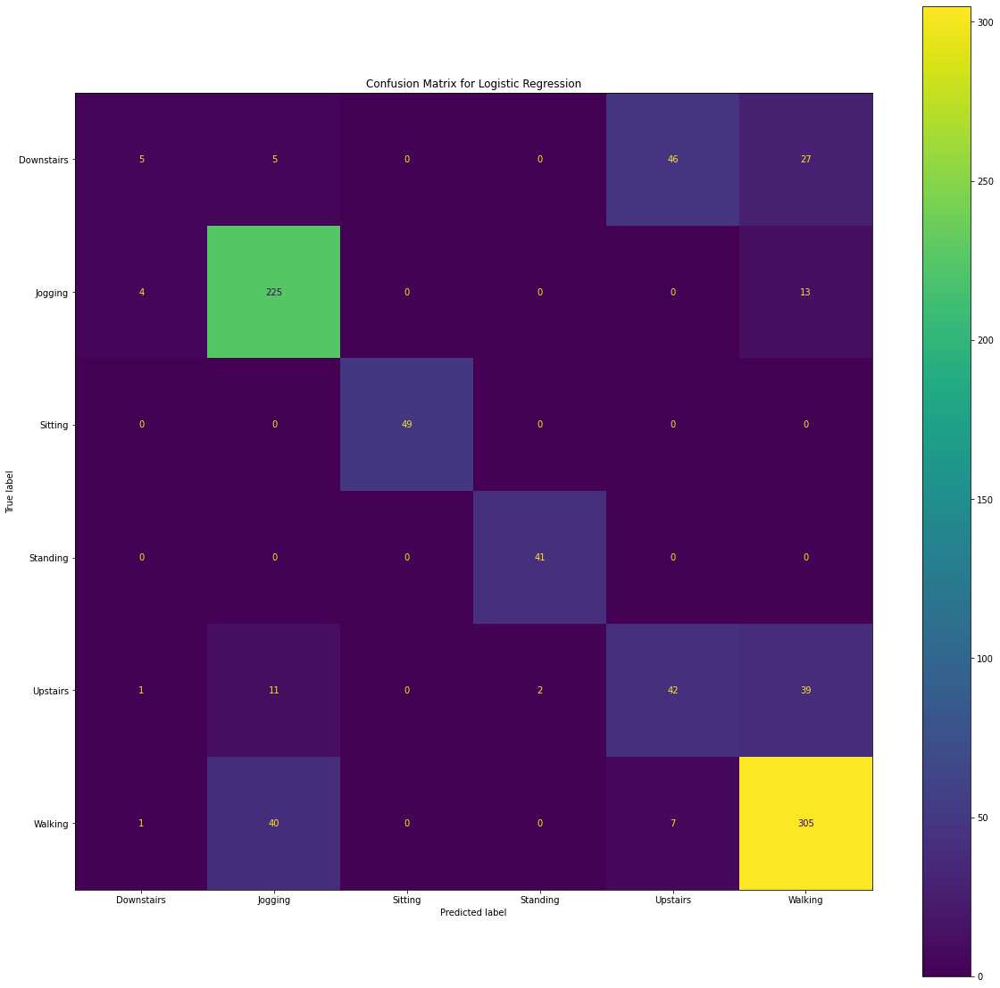

In [322]:
fig, ax = plt.subplots(figsize=(20, 20))
plot_confusion_matrix(model_lr, x_test, y_test, display_labels=label_names, ax=ax)
plt.title("Confusion Matrix for Logistic Regression")
plt.show()

## Support Vector Machine

Exp 1: Default SVC, training = 80.8%, testing = 75.20%<br>
Exp 2: RBF SVC, C=100 training = 82.85%, testing = 77.52%<br>
Exp 3: RBF SVC, C=10,training = 91.85%, testing = 78.80%<br>
Exp 4: Poly SVC, training = , testing = <br>

In [323]:
from sklearn.svm import SVC

In [347]:
model_svc = SVC(kernel='rbf', C=10).fit(x_train, y_train)
print(model_svc.score(x_train, y_train))
print(model_svc.score(x_test, y_test))

0.8755628325828899
0.7879490150637312


Training Report

              precision    recall  f1-score   support

  Downstairs       0.78      0.41      0.54       201
     Jogging       0.99      1.00      0.99       789
     Sitting       0.99      0.96      0.97       116
    Standing       0.94      1.00      0.97        84
    Upstairs       0.68      0.81      0.74       269
     Walking       0.94      0.98      0.96       984

    accuracy                           0.92      2443
   macro avg       0.89      0.86      0.86      2443
weighted avg       0.92      0.92      0.91      2443


Testing Report

              precision    recall  f1-score   support

  Downstairs       0.53      0.24      0.33        83
     Jogging       0.82      0.94      0.88       242
     Sitting       0.92      1.00      0.96        49
    Standing       1.00      1.00      1.00        41
    Upstairs       0.41      0.65      0.50        95
     Walking       0.93      0.79      0.86       353

    accuracy                           0.79

Text(0.5, 1.0, 'Confusion Matrix for SVM(training)')

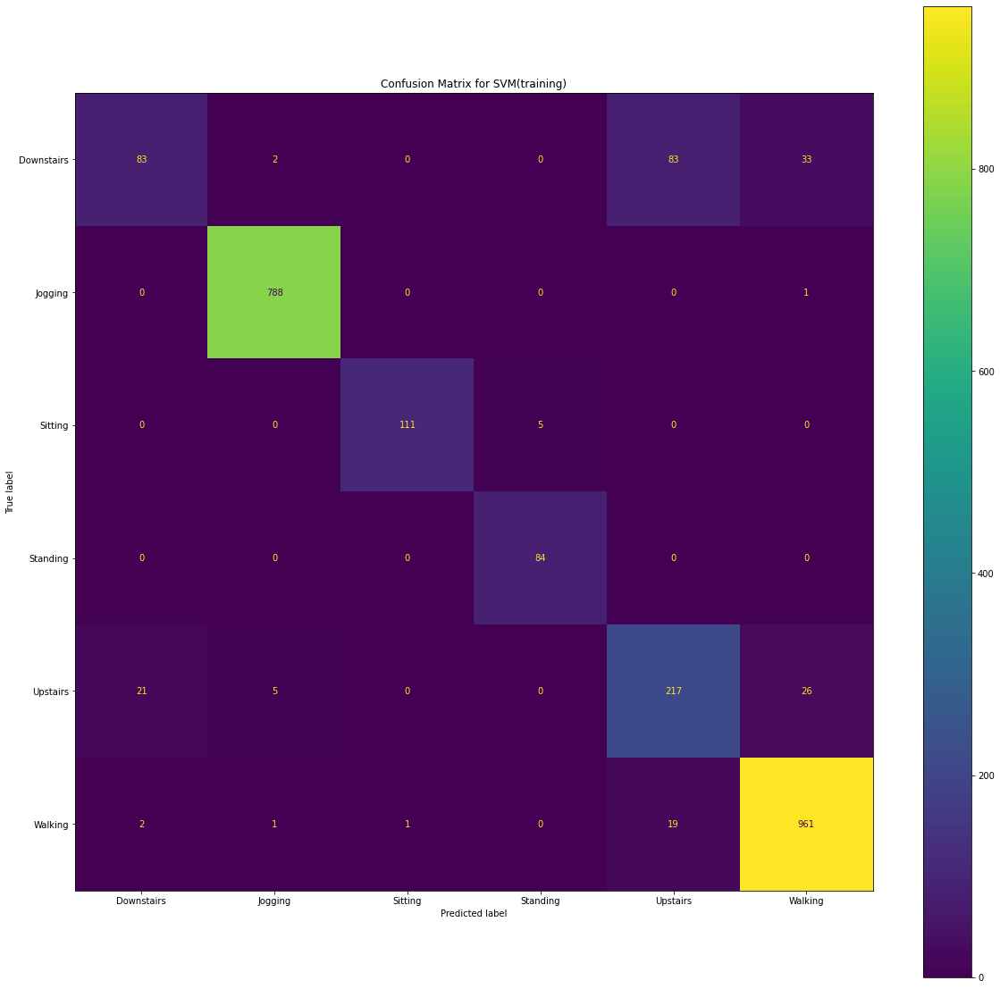

In [341]:
label_names = ['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking']

print("Training Report\n")
print(classification_report(y_train, model_svc.predict(x_train), target_names=label_names))

print("\nTesting Report\n")
print(classification_report(y_test, model_svc.predict(x_test), target_names=label_names))
fig, ax = plt.subplots(figsize=(20, 20))

plot_confusion_matrix(model_svc, x_train, y_train, display_labels=label_names, ax=ax)
plt.title("Confusion Matrix for SVM(training)")

## Random Forest Classifier
Exp 1: Default, training = 100%, testing = 87.83% -> Looks like overfitting, tuning max_depth and samples per leaf<br>
Exp 2:n_estimators = 500, max_depth=10, training = 99.67%%, testing = 87.25%%<br>


In [348]:
from sklearn.ensemble import RandomForestClassifier

In [367]:
model_rf = RandomForestClassifier().fit(x_train, y_train)
print(model_rf.score(x_train, y_train))
print(model_rf.score(x_test, y_test))

1.0
0.8644264194669756


Training Report

              precision    recall  f1-score   support

  Downstairs       1.00      1.00      1.00       201
     Jogging       1.00      1.00      1.00       789
     Sitting       1.00      1.00      1.00       116
    Standing       1.00      1.00      1.00        84
    Upstairs       1.00      1.00      1.00       269
     Walking       1.00      1.00      1.00       984

    accuracy                           1.00      2443
   macro avg       1.00      1.00      1.00      2443
weighted avg       1.00      1.00      1.00      2443


Testing Report

              precision    recall  f1-score   support

  Downstairs       0.88      0.80      0.84        83
     Jogging       0.82      0.92      0.86       242
     Sitting       0.91      0.98      0.94        49
    Standing       0.97      0.88      0.92        41
    Upstairs       0.73      0.81      0.77        95
     Walking       0.96      0.88      0.92       353

    accuracy                           0.88

Text(0.5, 1.0, 'Confusion Matrix for Random Forest(training)')

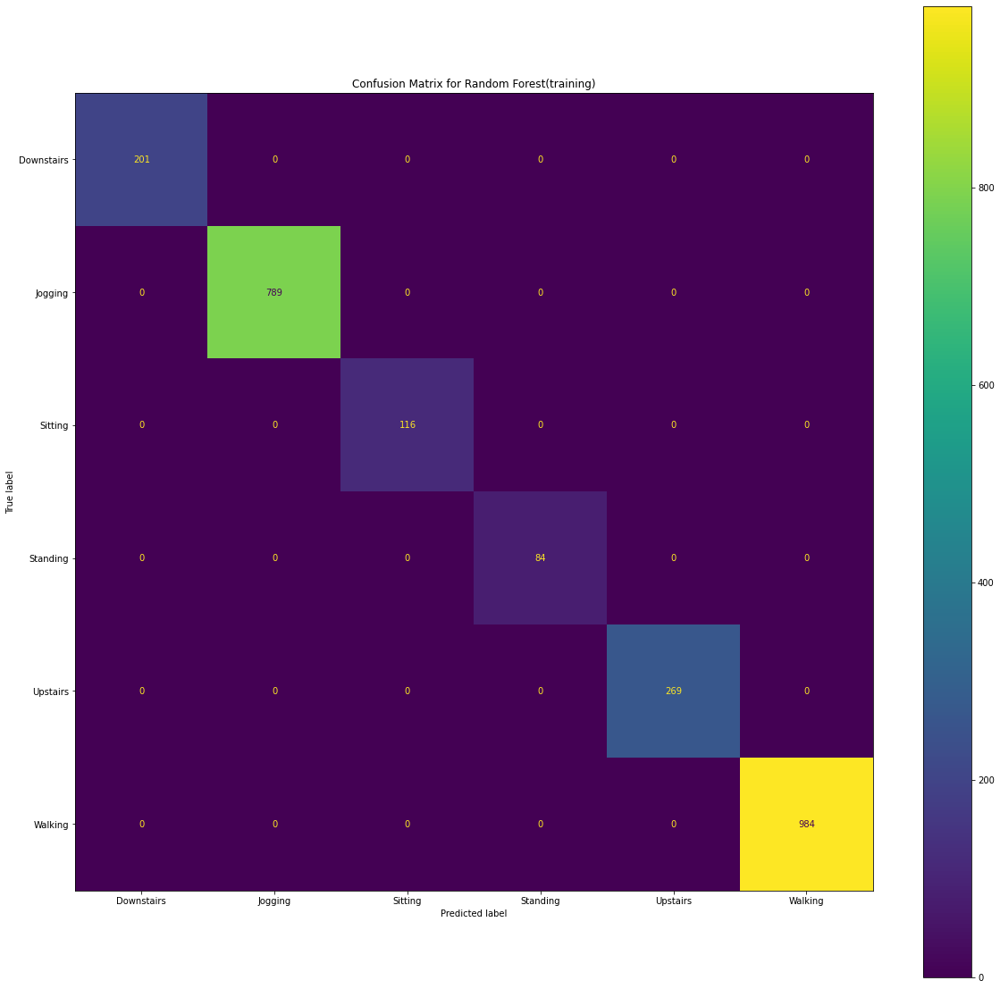

In [350]:
label_names = ['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking']

print("Training Report\n")
print(classification_report(y_train, model_rf.predict(x_train), target_names=label_names))

print("\nTesting Report\n")
print(classification_report(y_test, model_rf.predict(x_test), target_names=label_names))
fig, ax = plt.subplots(figsize=(20, 20))

plot_confusion_matrix(model_rf, x_train, y_train, display_labels=label_names, ax=ax)
plt.title("Confusion Matrix for Random Forest(training)")

Text(0.5, 1.0, 'Confusion Matrix for Random Forest(testing)')

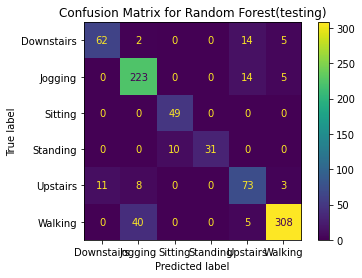

In [369]:

plot_confusion_matrix(model_rf, x_test, y_test, display_labels=label_names)#, ax=ax)
plt.title("Confusion Matrix for Random Forest(testing)")

## LOGO CrossValidation

In [7]:
test_groups = []
subgroup = []
for i in range(1,37):
    subgroup.extend([i]);
    if len(subgroup)==6:
        test_groups.append(subgroup);
        test_subgroup = [];

        
print(test_groups)    

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]]


In [9]:
train_dataset = pd.read_csv('train_dataset.csv')
test_dataset = pd.read_csv('test_dataset.csv')
complete_dataset = pd.concat([train_dataset, test_dataset])
complete_dataset.to_csv('complete_data.csv')

In [13]:
le = preprocessing.LabelEncoder().fit(complete_dataset.iloc[:,-1])
print(le.classes_)
le.transform(['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking'])
label_names = ['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking'];

['Downstairs' 'Jogging' 'Sitting' 'Standing' 'Upstairs' 'Walking']


In [20]:
#complete_dataset.iloc[:,-1]=le.transform(complete_dataset.iloc[:,-1])
#complete_dataset.drop([105])
complete_dataset.dropna(inplace=True)
complete_dataset

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106
0,0,-3.460450,2.801639,2.105504,-12.64,6.51,19.15,-3.380,1.610,3.1100,545,52,314,144,0.195271,0.819049,19.823894,-3.460450,2076.27,52.981908,43.618479,29.408558,3.512891,281.172866,277.659975,41.900846,19.253059,41.519919,0,300,110,96,2.413953,7.639235,4709.654307,52.981908,9.351833,5.375444,4.610852,-0.27,19.76,20.03,9.290,4.620,9.1300,3,597,297,137,0.038070,-1.105618,116.352189,9.351833,5611.10,84.837450,100.778878,53.832293,5.008367,994.807910,989.799543,60.458428,27.840641,57.730067,0,300,97,104,4.765134,30.820875,17353.775183,84.837450,0.086767,3.241298,2.082665,-5.830000,14.180000,20.010000,-0.420000,1.110000,2.237500,369,224,204,165,2.013403,5.111203,10.513542,0.086767,52.060000,61.148579,50.820836,32.711088,1.118785,422.241486,421.122701,49.067262,20.788270,42.186296,0,300,112,93,2.906587,12.381773,6321.906008,61.148579,19,5
1,1,-6.785617,8.792051,7.708747,-19.23,14.63,33.86,-5.485,7.055,15.9475,426,172,323,99,-0.007268,-1.149061,123.344757,-6.785617,4071.37,116.799260,180.936568,76.084406,2.471525,2101.931107,2099.459583,84.591704,34.522752,71.793876,0,300,81,97,7.040498,61.249977,46380.108980,116.799260,1.298567,9.065289,7.586308,-15.01,19.76,34.77,-1.760,4.770,13.5975,344,255,232,132,0.692650,-0.710583,83.865733,1.298567,779.14,118.154069,188.016115,76.831134,3.219851,2567.521118,2564.301267,82.726671,33.695633,69.677615,0,300,79,96,8.652201,98.674529,49310.443530,118.154069,-1.272967,4.154487,3.192656,-14.100000,15.170000,29.270000,-1.780000,2.580000,5.150000,399,198,272,160,0.695239,1.261348,18.880204,-1.272967,763.780000,80.479376,62.418121,37.897237,7.532423,572.712623,565.180200,68.804922,25.166863,49.087220,0,300,114,98,3.741421,21.376907,10372.951783,80.479376,19,1
2,2,-1.823883,4.156413,2.907534,-12.22,16.59,28.81,-2.220,2.070,4.0700,437,163,273,150,1.132060,3.669079,20.602320,-1.823883,1094.33,75.129618,68.741972,45.319544,2.951687,614.324473,611.372786,58.254128,31.231351,62.366331,0,300,108,99,3.162961,16.237367,10369.918192,75.129618,10.070617,4.286027,3.369406,-6.17,19.57,25.74,10.150,2.740,5.5400,2,598,305,151,-0.133312,-0.151731,119.787348,10.070617,6042.37,73.084001,75.430348,43.722228,2.104641,632.144206,630.039565,55.384724,26.121733,54.484497,0,300,105,93,4.086263,22.842001,11031.008576,73.084001,-1.586700,4.237739,2.971739,-17.670000,15.320000,32.990000,-2.140000,1.935000,3.850000,461,137,251,146,0.901279,2.305976,20.476048,-1.586700,952.020000,71.805242,74.964283,44.043303,1.766070,633.136570,631.370500,53.328564,22.944317,48.311912,0,300,103,101,3.960398,21.536792,10775.636507,71.805242,14,5
3,3,-5.691617,8.413660,7.065484,-19.61,10.99,30.60,-5.820,6.495,12.8775,435,163,294,132,0.062538,-1.011898,103.184170,-5.691617,3414.97,104.799677,177.464172,76.561737,5.855464,1920.619392,1914.763928,65.133486,30.687106,66.788002,0,300,76,95,6.659786,53.552574,42476.504520,104.799677,7.286400,9.786436,7.846389,-16.55,19.57,36.12,8.030,6.510,12.9625,114,486,313,133,-0.638908,-0.396885,148.865947,7.286400,4371.84,134.533850,198.409367,101.339182,5.755073,1615.563878,1609.808805,81.406787,35.815597,82.238022,0,300,74,96,4.551940,24.038064,57465.633425,134.533850,-1.254133,5.569137,4.685867,-15.850000,13.590000,29.440000,-1.250000,4.505000,9.010000,341,257,300,161,0.048146,-0.636931,32.588134,-1.254133,752.480000,92.304706,100.459295,57.392322,1.773888,975.866098,974.092210,67.045147,28.479632,59.558958,0,300,88,101,4.314359,26.570077,18612.228725,92.304706,10,1
4,4,5.761383,10.302227,9.009096,-15.01,19.57,34.58,6.890,9.460,18.7825,203,394,319,132,-0.225297,-1.226669,139.329412,5.761383,3456.83,202.265894,150.904443,111.407004,10.614147,991.379321,980.765174,161.113129,75.022477,156.693

In [38]:
complete_dataset = complete_dataset.drop(labels = ['105', 'Unnamed: 0', 'Unnamed: 0.1'], axis=1,inplace=True)
complete_dataset

In [37]:
complete_dataset = pd.read_csv('complete_data.csv')
complete_dataset.dropna(inplace=True)
complete_dataset.drop(labels = ['105', 0, 1 ], axis=1, inplace=True)

KeyError: '[0, 1] not found in axis'

In [ ]:
for folds in range(5):
    train = 

## Extra Credit Part

I will be talking about Random Forest model since it gave the best performance. The training accuracy was 100% whle the testing accuracy was ~88%. Looking at the testing confusion matrix, it can be seen that there is a lot of confusion between Walking and Jogging, which is somewhat understandable as the speed might not be high for a lot of jogs or walk speed might be high for some people.


I am trying to plot to see if it is a user-specific problem or a general one.

In [374]:
test_after_training = test_dataset.copy()
test_after_training

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106
0,2.776967,4.366357,3.411063,-6.820000,15.660000,22.480000,2.340000,2.790000,5.572500,155,442,270,142,0.450844,0.175721,26.776613,2.776967,1666.180000,66.210271,84.010869,46.432245,2.120107e+00,1024.238893,1022.118786,44.986625,23.701948,51.149116,0,300,97,92,5.904069,56.306837,11441.626120,66.210271,9.975900,4.520050,3.601216,0.650000,19.570000,18.920000,9.770000,2.665000,5.300000,0,600,289,157,0.277713,-0.475385,119.949437,9.975900,5985.540000,66.678678,88.443179,45.624731,1.342710,1156.678378,1155.335668,43.505999,19.332348,44.050159,0,300,88,91,7.079397,76.377833,12268.241981,66.678678,-0.750867,3.463429,2.719796,-7.545672,12.762266,20.307938,-1.900038,1.627632,4.300625,404,195,225,187,1.227670,1.565060,12.559142,-0.750867,450.520239,59.479547,60.522460,35.805885,3.360404,732.717909,729.357505,44.638436,20.841067,44.760439,0,300,102,92,5.461555,50.928829,7200.784728,59.479547,29,Walking
1,2.377367,5.777381,4.697094,-10.840000,17.820000,28.660000,1.080000,3.655000,7.780000,225,372,250,158,0.368113,-0.243330,39.030001,2.377367,1426.420000,80.602539,116.319550,58.201554,3.009786e-01,1450.271339,1449.970361,52.179289,23.804805,58.180575,0,300,82,98,6.801571,66.895441,20027.007093,80.602539,10.091750,7.880068,6.713042,-8.160000,19.570000,27.730000,11.220000,6.605000,13.390000,72,528,330,120,-0.520358,-0.732837,163.938895,10.091750,6055.050000,100.473753,164.810541,75.633834,4.070117,1961.959188,1957.889071,61.306848,31.062033,71.650853,0,300,81,100,7.192512,66.953798,37257.489567,100.473753,0.148267,4.378914,3.603764,-10.150000,11.260000,21.410000,-0.230000,3.090000,6.040000,305,294,288,152,0.035384,-0.552060,19.196869,0.148267,88.960000,62.213620,87.376423,42.326548,1.668740,1032.313136,1030.644396,41.183032,19.504379,40.765617,0,300,83,95,6.840278,62.746511,11505.173803,62.213620,34,Jogging
2,2.320017,6.592508,5.527319,-10.840000,18.620000,29.460000,0.820000,4.630000,9.500000,258,337,261,168,0.426974,-0.506166,48.843637,2.320017,1392.010000,84.235139,137.785053,60.349633,1.953776e+00,1751.657048,1749.703272,55.863806,26.590835,54.388999,0,300,79,92,7.873221,80.869183,26080.279528,84.235139,9.652183,8.025019,6.739509,-9.920000,19.570000,29.490000,10.630000,6.570000,13.077500,78,521,324,119,-0.515252,-0.678253,157.565572,9.652183,5791.310000,99.549649,169.501063,72.208255,6.385999,2041.088561,2034.702562,63.215076,30.444850,63.304041,0,300,78,98,7.398344,68.943443,38640.742944,99.549649,0.222917,5.043827,4.053792,-10.530000,16.930000,27.460000,-0.285000,3.245000,6.740000,311,288,282,174,0.453129,0.136094,25.489879,0.222917,133.750000,75.892958,97.501412,46.365324,0.955315,986.995686,986.040371,55.508210,23.569152,48.028324,0,300,97,100,5.884971,43.632665,15266.266400,75.892958,34,Jogging
3,-0.156467,2.597745,2.103614,-7.270000,6.360000,13.630000,-0.040000,1.800000,3.690000,301,298,313,172,-0.174501,-0.287808,6.772762,-0.156467,93.880000,40.276299,49.282595,26.057119,9.491754e-01,453.021801,452.072626,28.500149,13.290974,26.925562,0,300,86,93,4.776437,29.338730,4050.954360,40.276299,9.728500,4.380605,3.666318,1.080000,18.500000,17.420000,9.680000,3.370000,6.740000,0,600,297,160,-0.070598,-0.913987,113.833416,9.728500,5837.100000,65.983231,84.627444,40.875549,1.924277,1094.715677,1092.791399,48.250986,20.736745,43.916324,0,300,91,90,7.452409,77.335821,11515.591144,65.983231,1.586158,3.546232,2.217277,-4.753501,15.023244,19.776745,1.035146,1.116869,2.342700,174,424,210,157,1.983751,4.334899,15.091660,1.586158,951.694553,57.144601,65.433451,32.424426,1.471291,581.198889,579.727599,45.584163,20.847303,41.124090,0,300,112,96,5.487417,36.964647,7547.041900,57.144601,33,Walking
4,-0.191417,2.451220,2.004945,-6.930000,5.430

In [384]:
test_preds = model_rf.predict(x_test)
test_preds = le.inverse_transform(test_preds)

In [382]:
analysis_df = []
analysis_df.append(test_after_training.iloc[:,105])
analysis_df.append(test_after_training.iloc[:,106])
analysis_df.append(test_preds)
analysis_df = pd.DataFrame(analysis_df).T



In [386]:
analysis_df = analysis_df.sort_values(105)
analysis_df

,105,106,Unnamed 0
338,28,Walking,Walking
696,28,Walking,Walking
163,28,Upstairs,Upstairs
164,28,Walking,Walking
167,28,Walking,Upstairs
602,28,Walking,Upstairs
177,28,Standing,Standing
596,28,Walking,Walking
798,28,Walking,Upstairs
44,28,Walking,Walking


In [390]:
analysis_df[(analysis_df[106]!=analysis_df['Unnamed 0']) & ((analysis_df[106]=='Walking') | (analysis_df[106]=="Jogging"))]

,105,106,Unnamed 0
167,28,Walking,Upstairs
602,28,Walking,Upstairs
798,28,Walking,Upstairs
677,28,Walking,Upstairs
105,30,Walking,Jogging
180,30,Walking,Jogging
91,30,Walking,Jogging
617,30,Walking,Jogging
638,30,Walking,Jogging
148,30,Walking,Jogging


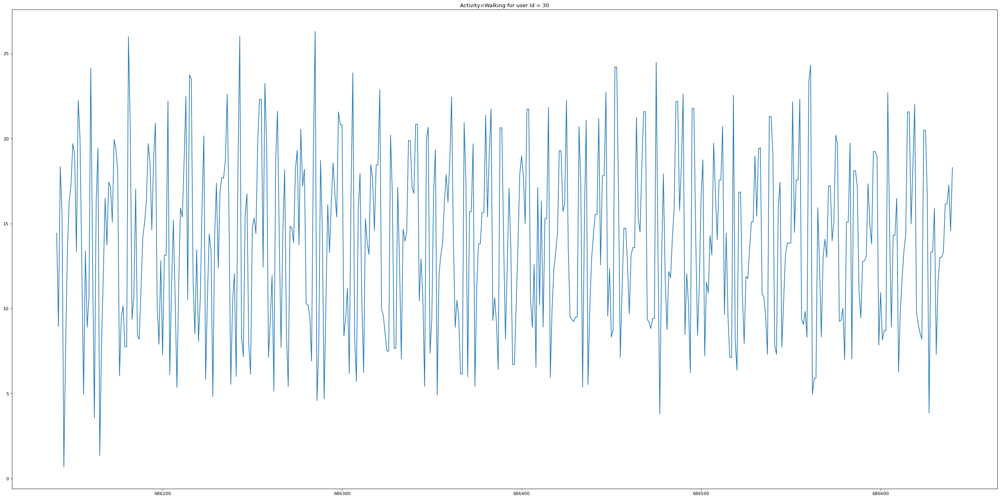

In [392]:
plot_user_activity(30, 'Walking', 0, 500)

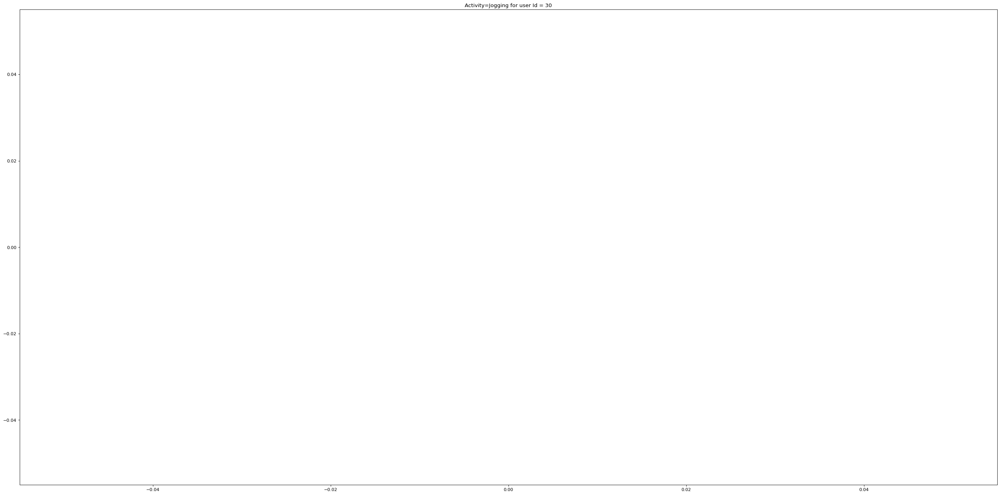

In [393]:
plot_user_activity(30, 'Jogging', 0, 500)

## Conclusion
Based on above data, it looks like User 30 is the problematic entry and for all his entries 'Walking' is misclassified as 'Jogging'. Upon delving deeper, it also appears that user 30 has no entry for jogging which makes it an unfit candidate for testing and it makes sense why there is an obvious mis-classification.
We can try to remove these instances from User 30 as it looks like an outlier.